In [2]:
import os
from glob import glob
from PIL import Image
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

In [10]:
import os
from glob import glob
from PIL import Image
import numpy as np
from tqdm import tqdm
from collections import defaultdict
import random

# ------ Configuration ------
VOC_ROOT = 'C:/dl project dataset/archive (2)/VOC2012_train_val/VOC2012_train_val'
OUTPUT_ROOT = 'C:/dl project dataset/balanced_dataset'

CLASSES = [
    'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair',
    'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
    'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'
]  # 20 classes (no background)

# Create output structure
os.makedirs(OUTPUT_ROOT, exist_ok=True)
for cls in CLASSES:
    os.makedirs(os.path.join(OUTPUT_ROOT, cls, 'images'), exist_ok=True)
    os.makedirs(os.path.join(OUTPUT_ROOT, cls, 'masks'), exist_ok=True)

# ------ Data Collection ------
# Dictionary to track images per class
class_images = defaultdict(list)

# Collect all valid images and their classes
voc_img_dir = os.path.join(VOC_ROOT, 'JPEGImages')
voc_mask_dir = os.path.join(VOC_ROOT, 'SegmentationClass')

for mask_path in tqdm(glob(os.path.join(voc_mask_dir, '*.png'))):
    img_name = os.path.splitext(os.path.basename(mask_path))[0]
    img_path = os.path.join(voc_img_dir, img_name + ".jpg")
    
    if not os.path.exists(img_path):
        continue
        
    mask = np.array(Image.open(mask_path))
    valid_classes = np.unique(mask[(mask >= 1) & (mask <= 20)])
    
    for cid in valid_classes:
        class_name = CLASSES[cid-1]  # Map to our CLASSES list
        class_images[class_name].append((img_path, mask_path))

# ------ Balance Classes ------
# Find minimum number of images across all classes
min_count = min(len(images) for images in class_images.values())
print(f"Balancing classes to {min_count} images each")

# ------ Dataset Creation ------
for class_name, img_list in class_images.items():
    # Randomly sample to balance class counts
    sampled = random.sample(img_list, min_count)
    
    # Save images and masks for this class
    out_img_dir = os.path.join(OUTPUT_ROOT, class_name, 'images')
    out_mask_dir = os.path.join(OUTPUT_ROOT, class_name, 'masks')
    
    for img_path, mask_path in tqdm(sampled, desc=f"Processing {class_name}"):
        img_name = os.path.splitext(os.path.basename(img_path))[0]
        
        # Load and process mask
        mask = np.array(Image.open(mask_path))
        cid = CLASSES.index(class_name) + 1  # VOC class ID
        
        # Create binary mask: 1=current class, 0=background+other classes
        bin_mask = (mask == cid).astype(np.uint8)
        
        # Save with original image
        Image.open(img_path).convert("RGB").save(os.path.join(out_img_dir, f"{img_name}.jpg"))
        Image.fromarray(bin_mask * 255).save(os.path.join(out_mask_dir, f"{img_name}.png"))

print("Dataset created with:")
print(f"- {len(CLASSES)} foreground classes")
print(f"- {min_count} images per class")
print(f"- Implicit background class (0) in all masks")

100%|██████████| 2913/2913 [00:03<00:00, 840.93it/s] 


Balancing classes to 120 images each


Processing pottedplant: 100%|██████████| 120/120 [00:00<00:00, 139.97it/s]

Dataset created with:
- 20 foreground classes
- 120 images per class
- Implicit background class (0) in all masks


In [11]:
from torchvision.transforms import functional as F
import random

class JointResize:
    def __init__(self, size):
        self.size = size

    def __call__(self, img, mask):
        img = F.resize(img, self.size, interpolation=Image.BILINEAR)
        mask = F.resize(mask, self.size, interpolation=Image.NEAREST)
        return img, mask

class JointRandomHorizontalFlip:
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, img, mask):
        if random.random() < self.p:
            img = F.hflip(img)
            mask = F.hflip(mask)
        return img, mask

class JointCompose:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, mask):
        for t in self.transforms:
            img, mask = t(img, mask)
        return img, mask

In [12]:
from torchvision import transforms

# Joint transformations (applied to both image and mask)
joint_transform = JointCompose([
    JointResize((256, 256)),          # Resize to 256x256
    JointRandomHorizontalFlip(p=0.5), # Random horizontal flip
])

# Image-only transformations
transform_img = transforms.Compose([
    transforms.ColorJitter(
        brightness=0.2,  # Slight brightness adjustment
        contrast=0.2,    # Slight contrast adjustment
        saturation=0.2,  # Slight saturation adjustment
        hue=0.1          # Minor hue shift
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # Standard ImageNet mean
        std=[0.229, 0.224, 0.225]    # Standard ImageNet std
    )
])

# Mask-only transformations (convert to tensor)
transform_mask = transforms.Compose([
    transforms.ToTensor()
])

In [13]:
class SegmentationDataset(Dataset):
    def __init__(
        self,
        image_mask_pairs,
        #joint_transform=None,
        transform_img=None,
        transform_mask=None
    ):
        self.pairs = image_mask_pairs
        self.joint_transform = joint_transform
        self.transform_img = transform_img
        self.transform_mask = transform_mask

    def __len__(self):
        return len(self.pairs)
    
    def __getitem__(self, idx):
        img_path, mask_path, class_idx = self.pairs[idx]
        
        image = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')  # Ensure mask is in grayscale mode

        # Apply joint transforms
       # if self.joint_transform:
        #    image, mask = self.joint_transform(image, mask)

        # Apply image and mask-specific transforms
        if self.transform_img:
            image = self.transform_img(image)
        if self.transform_mask:
            mask = self.transform_mask(mask)

        return image, mask.long(), class_idx

In [14]:
root = r'C:\dl project dataset\model testing dataset(only 3 classes)'
class_names = sorted(os.listdir(root))
all_pairs = []

for class_idx, class_name in enumerate(class_names):
    image_dir = os.path.join(root, class_name, 'images')
    mask_dir  = os.path.join(root, class_name, 'masks')
    
    image_files = sorted(glob(os.path.join(image_dir, '*.jpg')))
    mask_files  = sorted(glob(os.path.join(mask_dir, '*.png')))
    
    # Ensure matched files (by name). We assume corresponding files have the same basename
    basenames = [os.path.splitext(os.path.basename(f))[0] for f in image_files]
    for bname in basenames:
        img_path = os.path.join(image_dir, f'{bname}.jpg')
        mask_path = os.path.join(mask_dir,  f'{bname}.png')
        if os.path.exists(img_path) and os.path.exists(mask_path):
            all_pairs.append((img_path, mask_path, class_idx))
        else:
            print(f"Missing: {img_path} or {mask_path}")

print(f"Total image-mask pairs: {len(all_pairs)}")

Total image-mask pairs: 499


In [15]:
import matplotlib.pyplot as plt
import random
import torch
import numpy as np

def show_random_sample(dataset, class_colors=None):
    idx = random.randint(0, len(dataset)-1)
    img, mask, class_idx = dataset[idx]
    
    # Ensure we're working with tensors
    assert isinstance(img, torch.Tensor), "Input image should be a tensor"
    
    # Clone to avoid modifying original data
    img_normalized = img.clone()
    
    # Denormalize the image
    mean = torch.tensor([0.485, 0.456, 0.406], device=img.device)
    std = torch.tensor([0.229, 0.224, 0.225], device=img.device)
    img_denorm = img_normalized.clone().detach()
    img_denorm = img_denorm * std[:, None, None] + mean[:, None, None]
    
    # Convert tensors to numpy arrays
    img_norm_np = img_normalized.permute(1, 2, 0).cpu().numpy()  # Normalized (network input)
    img_denorm_np = img_denorm.permute(1, 2, 0).cpu().numpy()    # Denormalized (human-viewable)
    img_denorm_np = np.clip(img_denorm_np, 0, 1)  # Ensure valid range
    
    # Process mask
    if isinstance(mask, torch.Tensor):
        mask_np = mask.squeeze().cpu().numpy().astype(int)
    else:
        mask_np = np.array(mask).astype(int)
    
    # Create figure
    plt.figure(figsize=(18, 6))
    
    # Plot Normalized Image (as seen by the network)
    plt.subplot(1, 3, 1)
    plt.imshow((img_norm_np - img_norm_np.min()) / (img_norm_np.max() - img_norm_np.min()))
    plt.title("Normalized Input to Network\n(Channel-wise Scaled for Visualization)")
    plt.axis('off')
    
    # Plot Denormalized Image
    plt.subplot(1, 3, 2)
    plt.imshow(img_denorm_np)
    plt.title("Denormalized Image\n(Original Color Space)")
    plt.axis('off')
    
    # Plot Mask
    plt.subplot(1, 3, 3)
    if class_colors is not None:
        if isinstance(class_colors, list):
            class_colors = np.array(class_colors)
        mask_rgb = np.zeros((*mask_np.shape, 3), dtype=np.uint8)
        for class_id, color in enumerate(class_colors):
            mask_rgb[mask_np == class_id] = color
        plt.imshow(mask_rgb)
    else:
        plt.imshow(mask_np, cmap='gray' if len(np.unique(mask_np)) <= 2 else 'viridis')
    plt.title('Segmentation Mask')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

    # Print statistics
    print("Normalized Tensor Statistics:")
    print(f"  Shape: {img_normalized.shape}")
    print(f"  Mean: {img_normalized.mean(dim=[1, 2]).cpu().numpy()}")
    print(f"  Std: {img_normalized.std(dim=[1, 2]).cpu().numpy()}")
    print(f"  Global Min: {img_normalized.min().item():.3f}, Max: {img_normalized.max().item():.3f}")
    
    print("\nDenormalized Image Statistics:")
    print(f"  Shape: {img_denorm_np.shape}")
    print(f"  Min: {img_denorm_np.min():.3f}, Max: {img_denorm_np.max():.3f}")
    print(f"  Mean: {np.mean(img_denorm_np, axis=(0, 1))}")
    
    print(f"\nMask Statistics (Class {class_idx}):")
    print(f"  Unique values: {np.unique(mask_np)}")
    print(f"  Shape: {mask_np.shape}")

In [16]:
train_pairs, val_pairs = train_test_split(
    all_pairs, 
    test_size=0.2, 
    stratify=[p[2] for p in all_pairs], # stratify by class
    random_state=42
)

In [17]:

img_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    #transforms.RandomHorizontalFlip(),
    #transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    # Optionally add normalization:
     #transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])

mask_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.squeeze().long()) # convert 1xHxW to HxW, int labels
])

In [18]:
BATCH_SIZE = 16
LEARNING_RATE = 1e-4
EPOCHS= 30
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [19]:
from torchvision import transforms

# Joint transformations (applied to both image and mask)
joint_transform = JointCompose([
    JointResize((256, 256)),          # Resize to 256x256
    JointRandomHorizontalFlip(p=0.5), # Random horizontal flip
])

# Image-only transformations
transform_img = transforms.Compose([
    transforms.ColorJitter(
        brightness=0.2,  # Slight brightness adjustment
        contrast=0.2,    # Slight contrast adjustment
        saturation=0.2,  # Slight saturation adjustment
        hue=0.1          # Minor hue shift
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # Standard ImageNet mean
        std=[0.229, 0.224, 0.225]    # Standard ImageNet std
    )
])

# Mask-only transformations (convert to tensor)
transform_mask = transforms.Compose([
    transforms.ToTensor()
])

In [20]:
train_dataset = SegmentationDataset(train_pairs, img_transform, mask_transform)
val_dataset = SegmentationDataset(val_pairs,img_transform, mask_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)




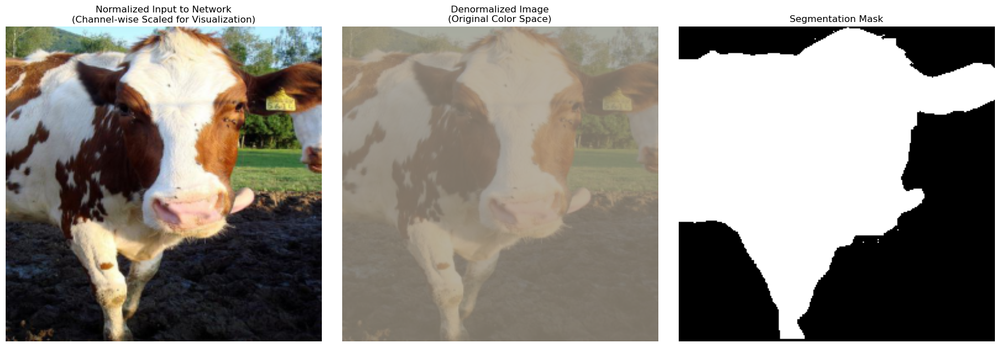

Normalized Tensor Statistics:
  Shape: torch.Size([3, 256, 256])
  Mean: [0.41118404 0.38344732 0.342426  ]
  Std: [0.32097575 0.31593522 0.2960536 ]
  Global Min: 0.000, Max: 1.000

Denormalized Image Statistics:
  Shape: (256, 256, 3)
  Min: 0.406, Max: 0.714
  Mean: [0.57916117 0.54189223 0.48304582]

Mask Statistics (Class 2):
  Unique values: [0 1]
  Shape: (256, 256)


In [26]:
show_random_sample(train_dataset)

In [ ]:
# Example setup for dataset and DataLoader
dataset = SegmentationDataset(
    image_mask_pairs=train_pairs,  # Replace with your data
    joint_transform=joint_transform,
    transform_img=transform_img,
    transform_mask=transform_mask
)

dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=4, shuffle=True, num_workers=4
)
show_random_sample(dataset)

TypeError: __init__() got an unexpected keyword argument 'joint_transform'

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, n_classes, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        # Encoder
        self.downs = nn.ModuleList()
        self.pools = nn.ModuleList()
        prev_channels = in_channels
        for feature in features:
            self.downs.append(DoubleConv(prev_channels, feature))
            self.pools.append(nn.MaxPool2d(2))
            prev_channels = feature

        # Bottleneck
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)

        # Decoder
        self.ups = nn.ModuleList()
        self.up_convs = nn.ModuleList()
        decoder_features = features[::-1]
        prev_channels = features[-1]*2
        for feature in decoder_features:
            self.ups.append(nn.ConvTranspose2d(prev_channels, feature, kernel_size=2, stride=2))
            self.up_convs.append(DoubleConv(feature*2, feature))
            prev_channels = feature

        self.final_conv = nn.Conv2d(decoder_features[-1], n_classes, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        # Encoder
        for down, pool in zip(self.downs, self.pools):
            x = down(x)
            skip_connections.append(x)
            x = pool(x)

        # Bottleneck
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        # Decoder
        for idx in range(len(self.ups)):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx]
            # If needed, pad x to the same size as skip_connection
            if x.shape != skip_connection.shape:
                x = F.interpolate(x, size=skip_connection.shape[2:])
            x = torch.cat((skip_connection, x), dim=1)
            x = self.up_convs[idx](x)

        x = self.final_conv(x)
        return x

In [23]:
import torch
import torch.nn.functional as F

def dhmetriv_loss(outputs, targets, mask, weight_consistency=0.1, class_weights=None):
    """
    outputs: (B, C, H, W) logits
    targets: (B, H, W), int64
    mask:    (B, H, W), float32, 1 for labeled pixels, 0 elsewhere
    class_weights: torch.tensor of shape (C,)
    """

    # 1. Cross-entropy on labeled pixels (mask==1)
    ce = F.cross_entropy(
        outputs, targets, weight=class_weights, reduction='none'
    ) # [B, H, W]
    labeled_loss = (ce * mask).sum() / (mask.sum() + 1e-6)

    # 2. Entropy loss (minimize entropy on unlabeled pixels)
    probs = torch.softmax(outputs, dim=1)
    entropy = - (probs * torch.log(probs + 1e-6)).sum(dim=1) # [B, H, W]
    confidence_loss = ((1 - mask) * entropy).sum() / ((1 - mask).sum() + 1e-6)

    return labeled_loss + weight_consistency * confidence_loss

In [24]:
import torch

N_CLASSES = 3
weights = torch.ones(N_CLASSES)
weights[0] = 0.05   # background
weights[1:] = 1.0   # foreground classes
weights = weights.to(DEVICE)

Model saved (epoch 1, mIoU 0.368)
Epoch   1: Train Loss: 0.8866, Val Loss: 0.3287, Val mIoU: 0.368
Visualizing first validation batch:


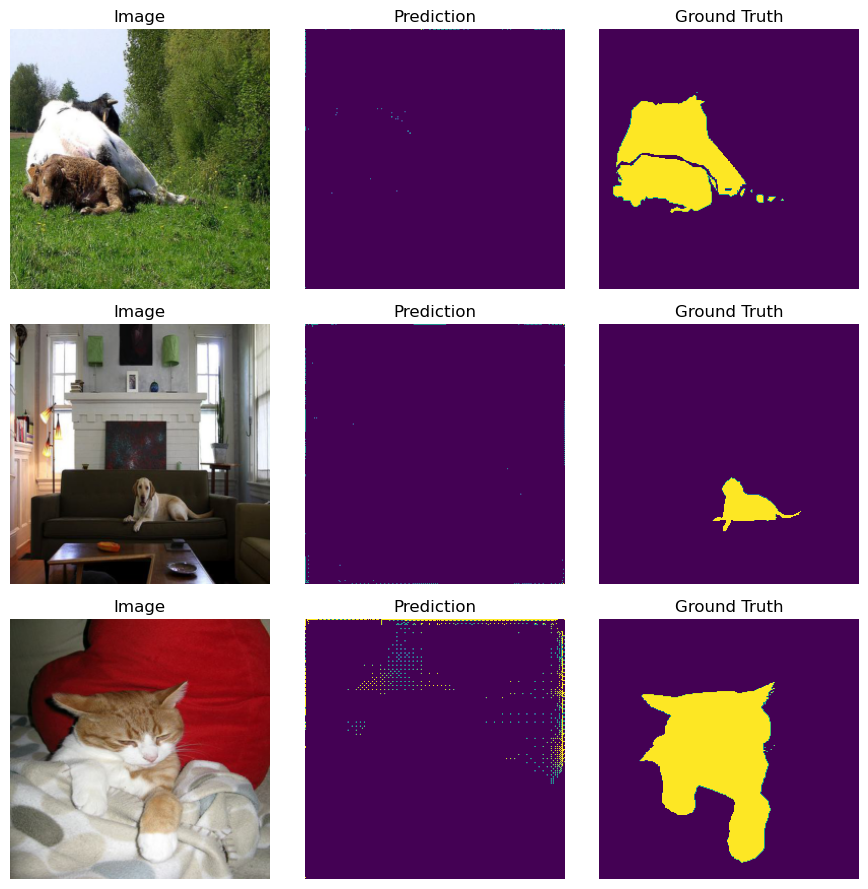

Model saved (epoch 2, mIoU 0.382)
Epoch   2: Train Loss: 0.7308, Val Loss: 0.1474, Val mIoU: 0.382
Visualizing first validation batch:


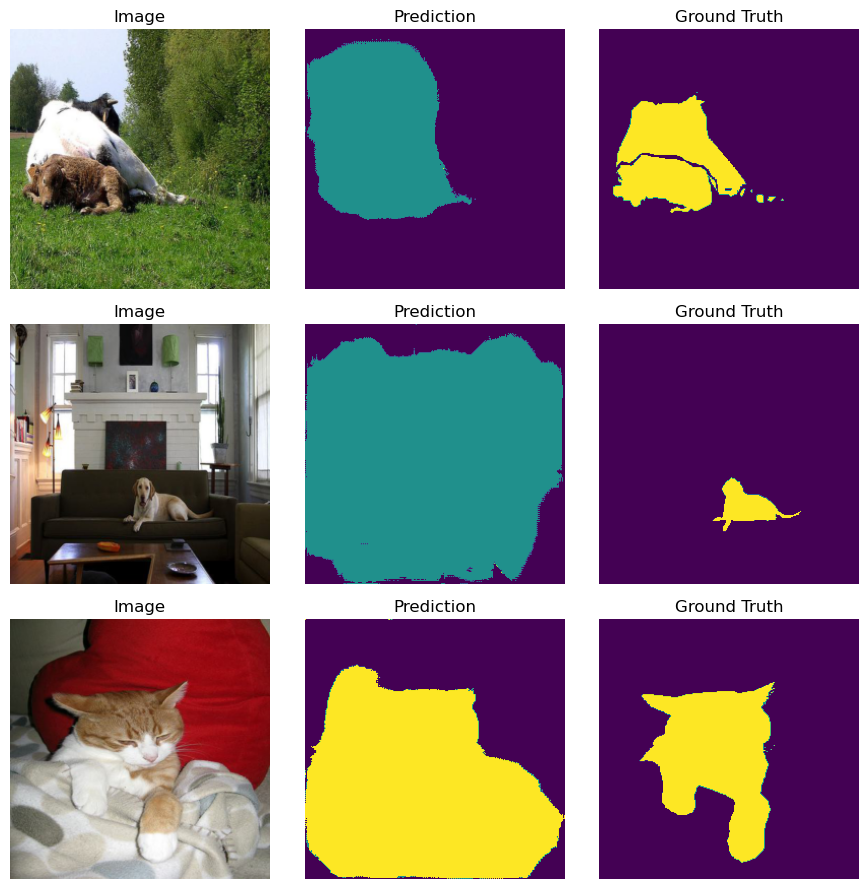

Model saved (epoch 3, mIoU 0.548)
Epoch   3: Train Loss: 0.6334, Val Loss: 0.3190, Val mIoU: 0.548
Visualizing first validation batch:


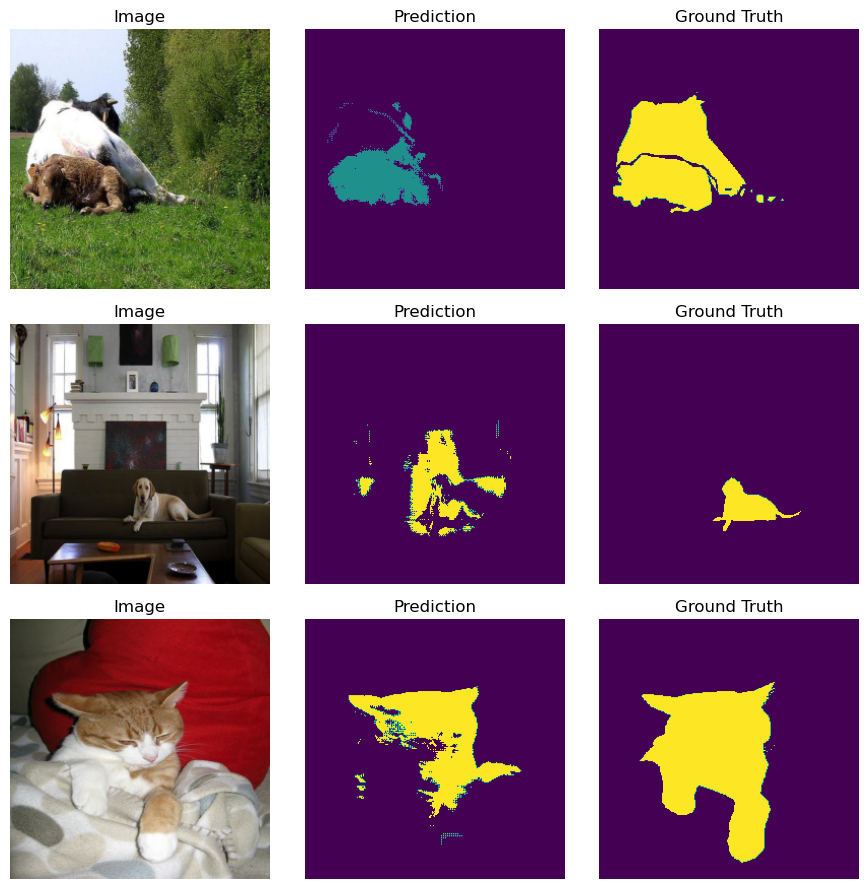

Epoch   4: Train Loss: 0.5797, Val Loss: 0.2104, Val mIoU: 0.509
Visualizing first validation batch:


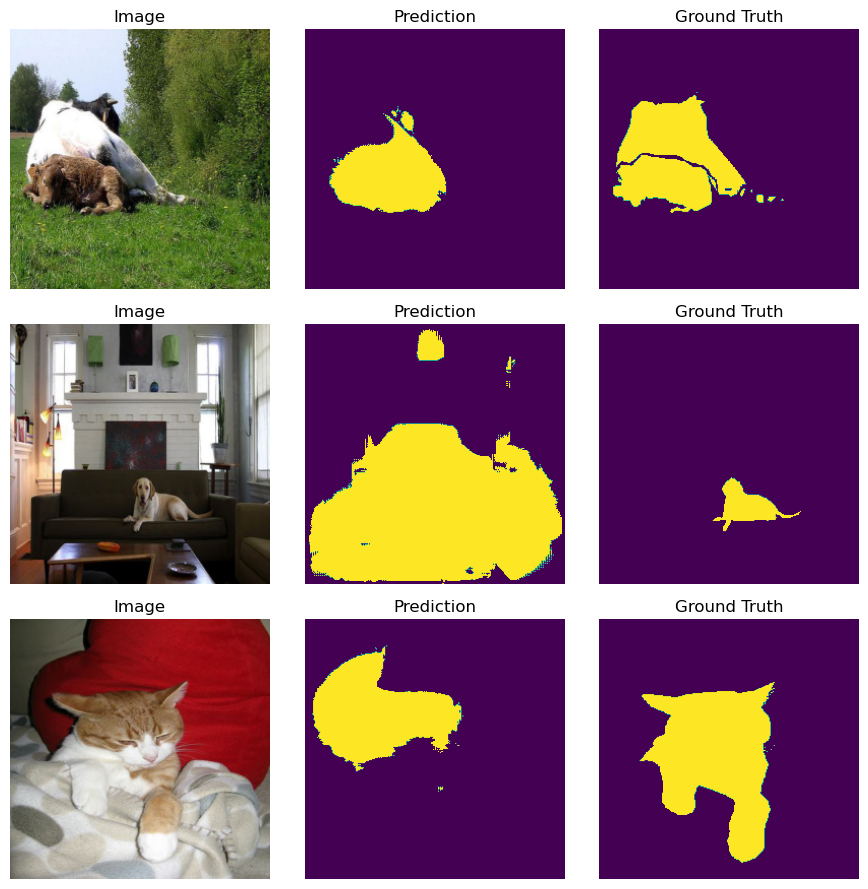

Model saved (epoch 5, mIoU 0.586)
Epoch   5: Train Loss: 0.5455, Val Loss: 0.2069, Val mIoU: 0.586
Visualizing first validation batch:


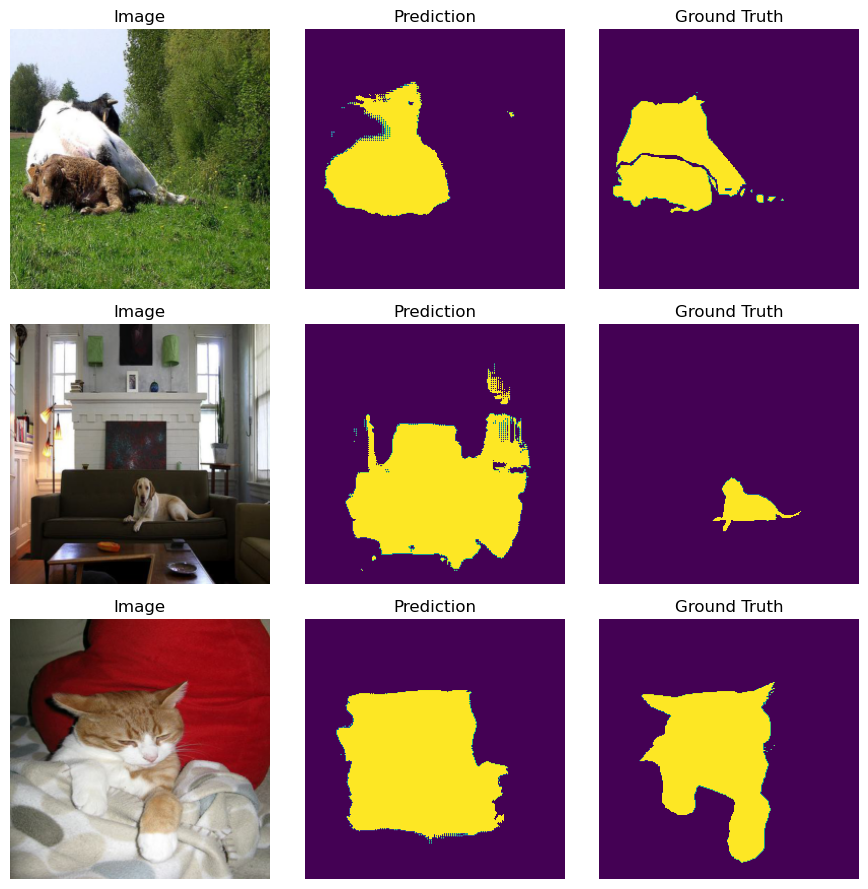

Model saved (epoch 6, mIoU 0.593)
Epoch   6: Train Loss: 0.5058, Val Loss: 0.2453, Val mIoU: 0.593
Visualizing first validation batch:


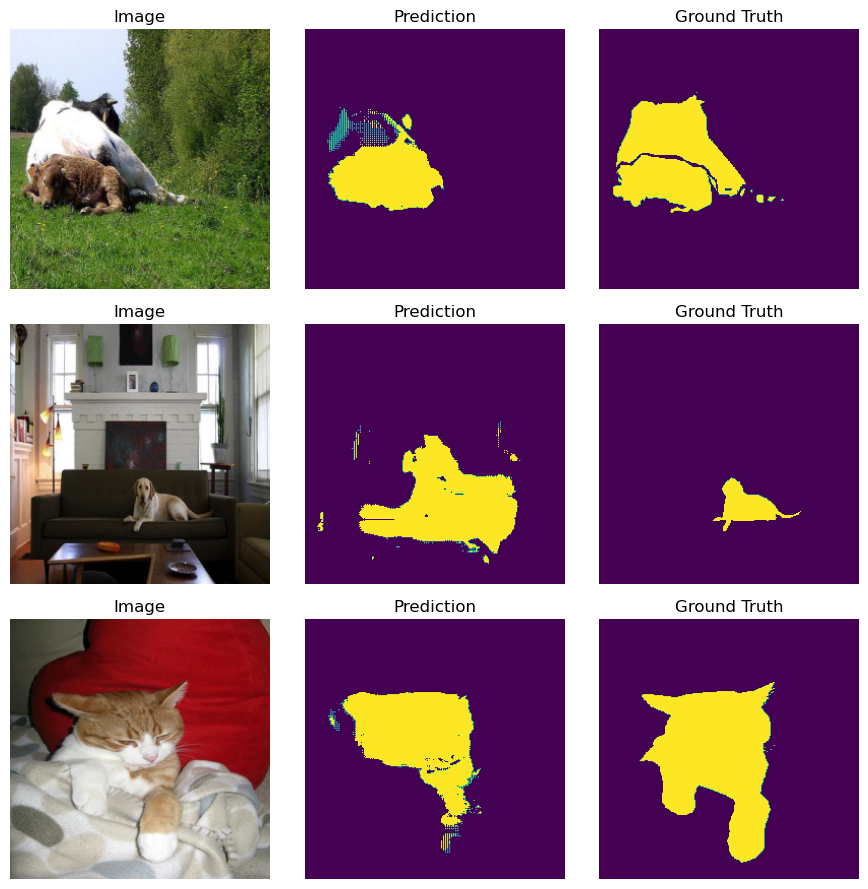

Model saved (epoch 7, mIoU 0.617)
Epoch   7: Train Loss: 0.4759, Val Loss: 0.2406, Val mIoU: 0.617
Visualizing first validation batch:


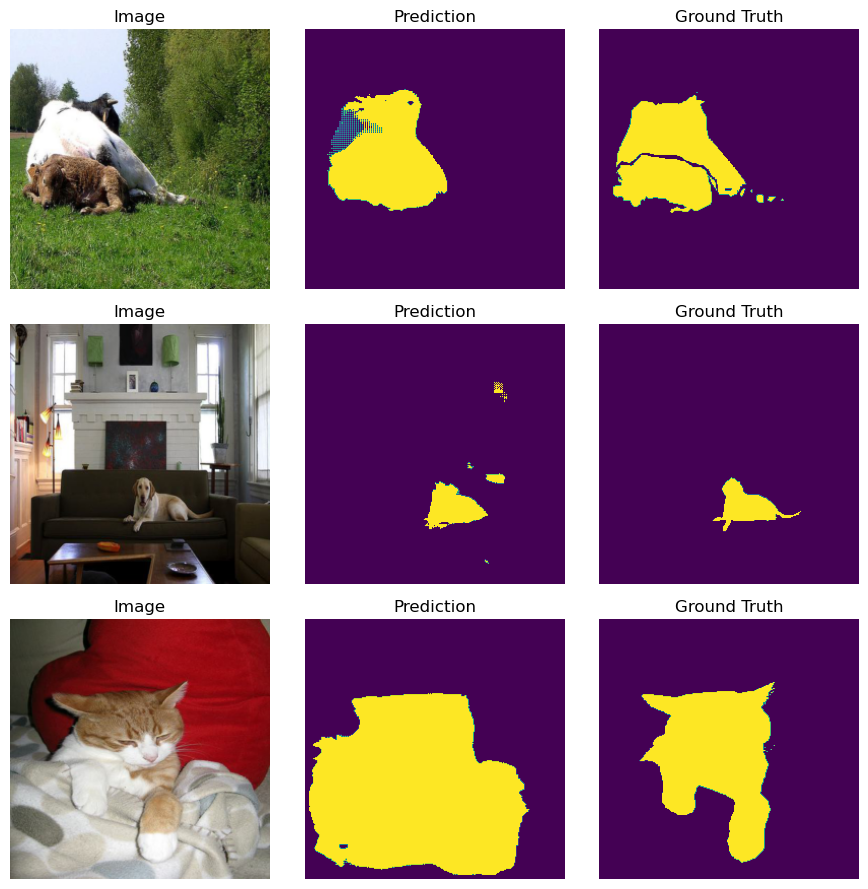

Model saved (epoch 8, mIoU 0.636)
Epoch   8: Train Loss: 0.4583, Val Loss: 0.2141, Val mIoU: 0.636
Visualizing first validation batch:


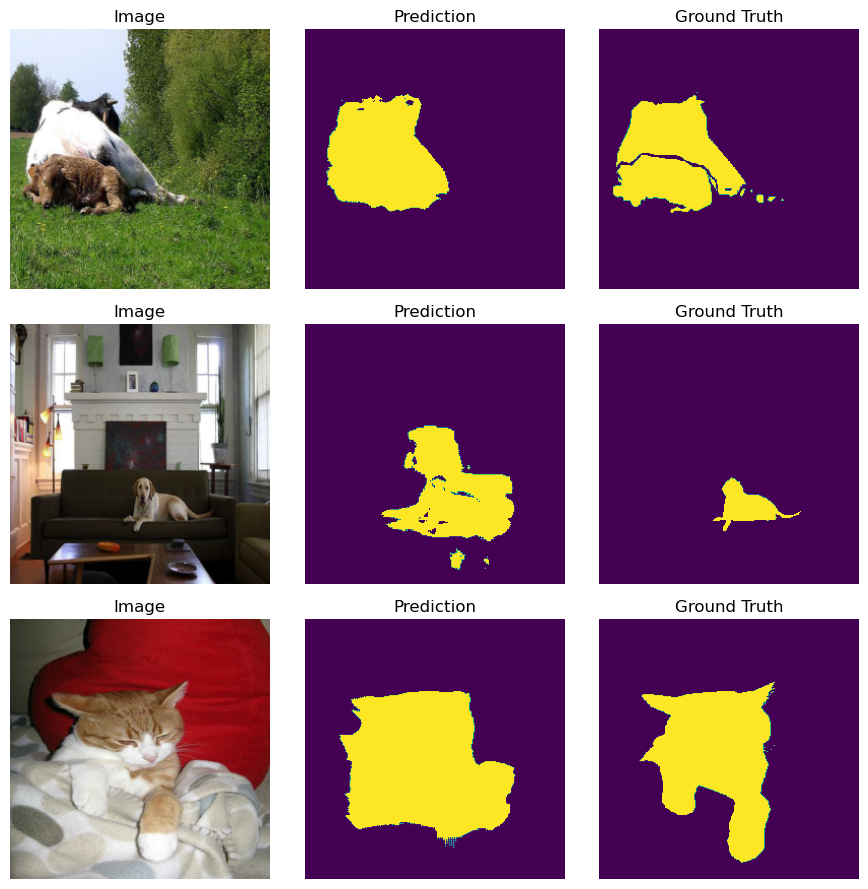

Model saved (epoch 9, mIoU 0.638)
Epoch   9: Train Loss: 0.4295, Val Loss: 0.2126, Val mIoU: 0.638
Visualizing first validation batch:


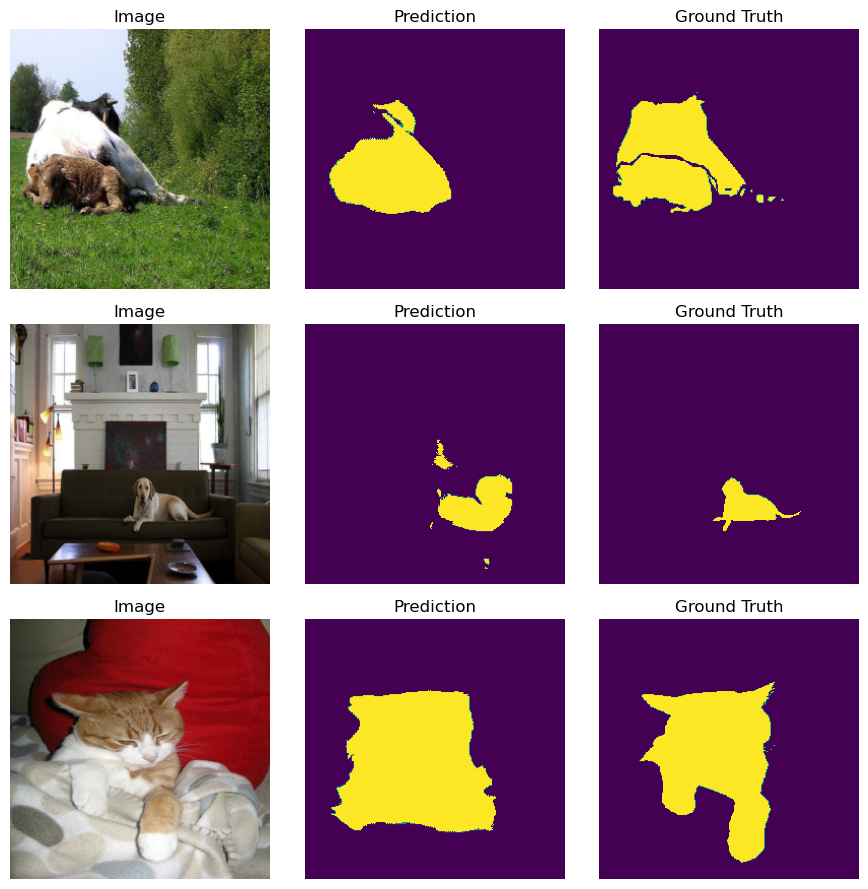

Epoch  10: Train Loss: 0.4278, Val Loss: 0.2059, Val mIoU: 0.634
Visualizing first validation batch:


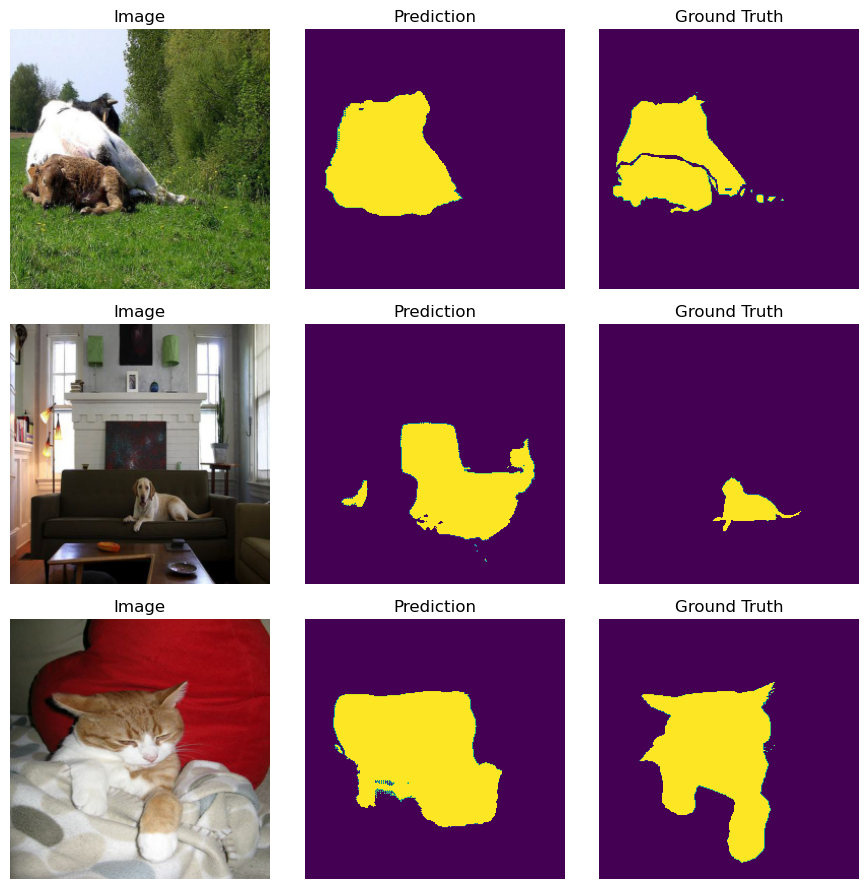

Model saved (epoch 11, mIoU 0.653)
Epoch  11: Train Loss: 0.4116, Val Loss: 0.2075, Val mIoU: 0.653
Visualizing first validation batch:


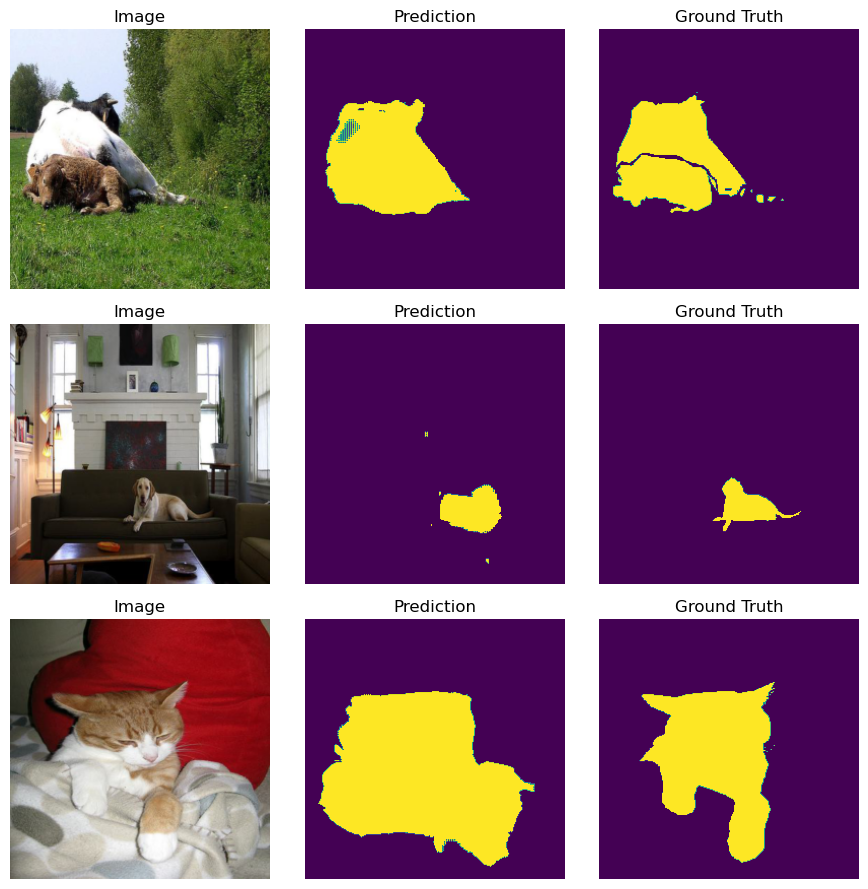

Epoch  12: Train Loss: 0.3853, Val Loss: 0.2738, Val mIoU: 0.618
Visualizing first validation batch:


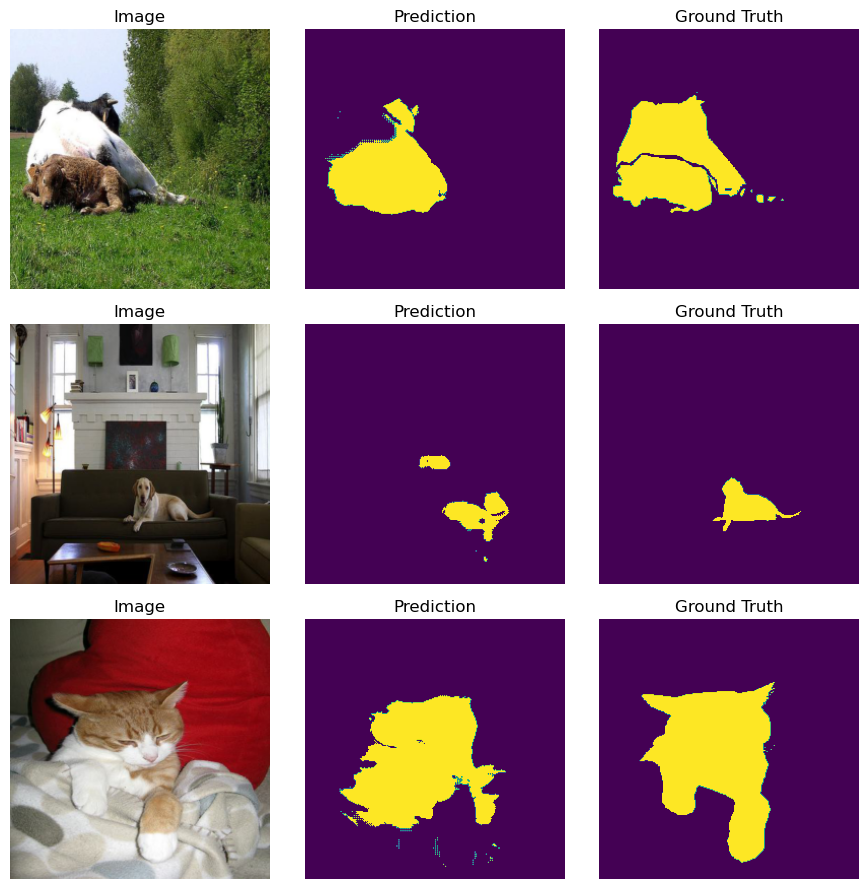

Epoch  13: Train Loss: 0.3707, Val Loss: 0.2018, Val mIoU: 0.642
Visualizing first validation batch:


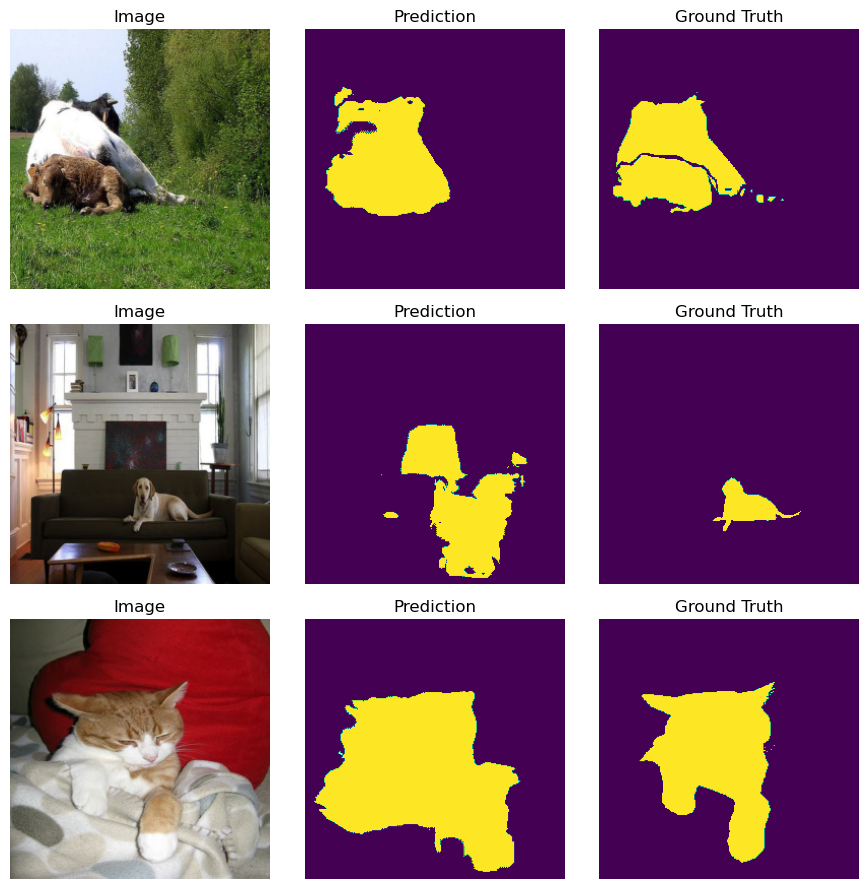

Epoch  14: Train Loss: 0.3560, Val Loss: 0.3268, Val mIoU: 0.583
Visualizing first validation batch:


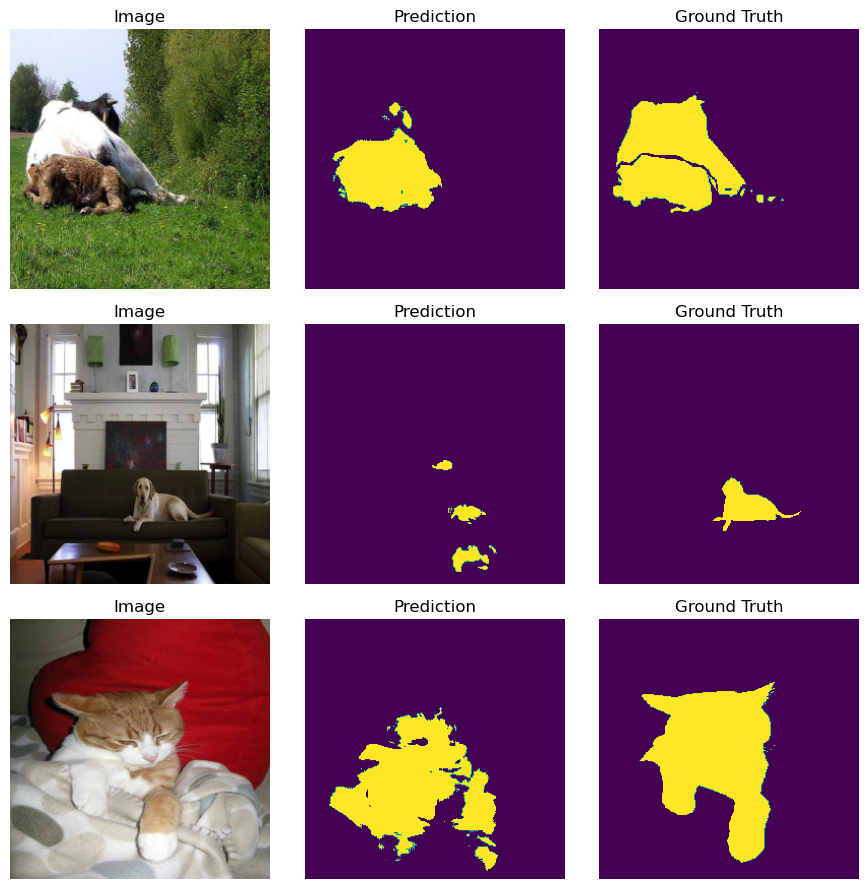

Epoch  15: Train Loss: 0.3513, Val Loss: 0.1905, Val mIoU: 0.643
Visualizing first validation batch:


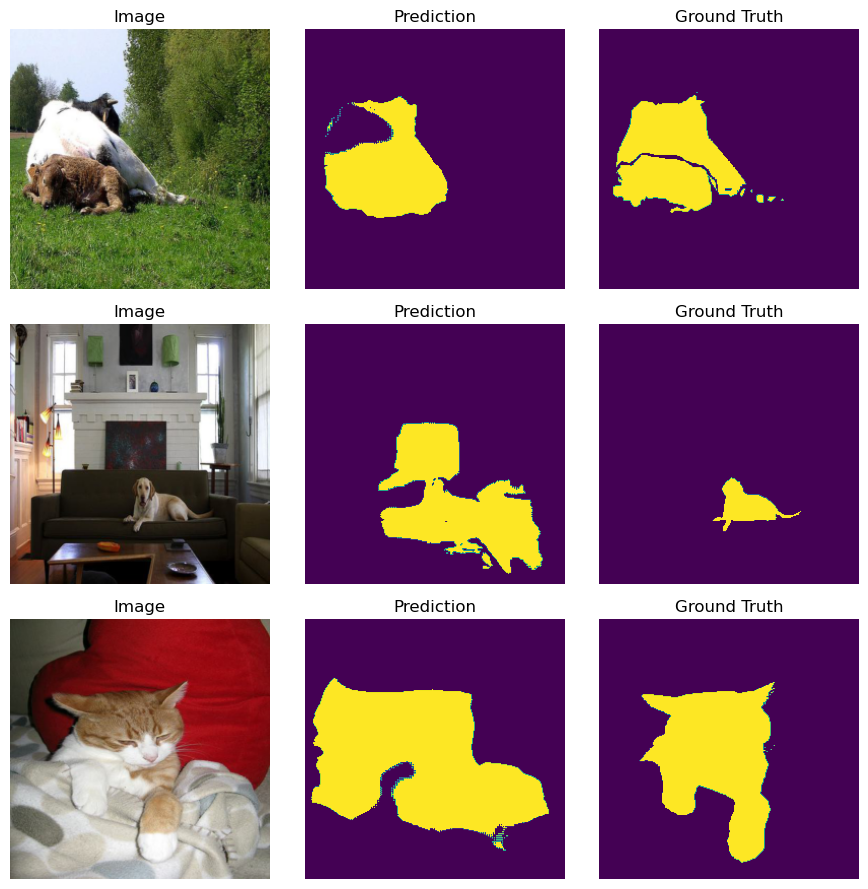

Epoch  16: Train Loss: 0.3401, Val Loss: 0.2978, Val mIoU: 0.628
Visualizing first validation batch:


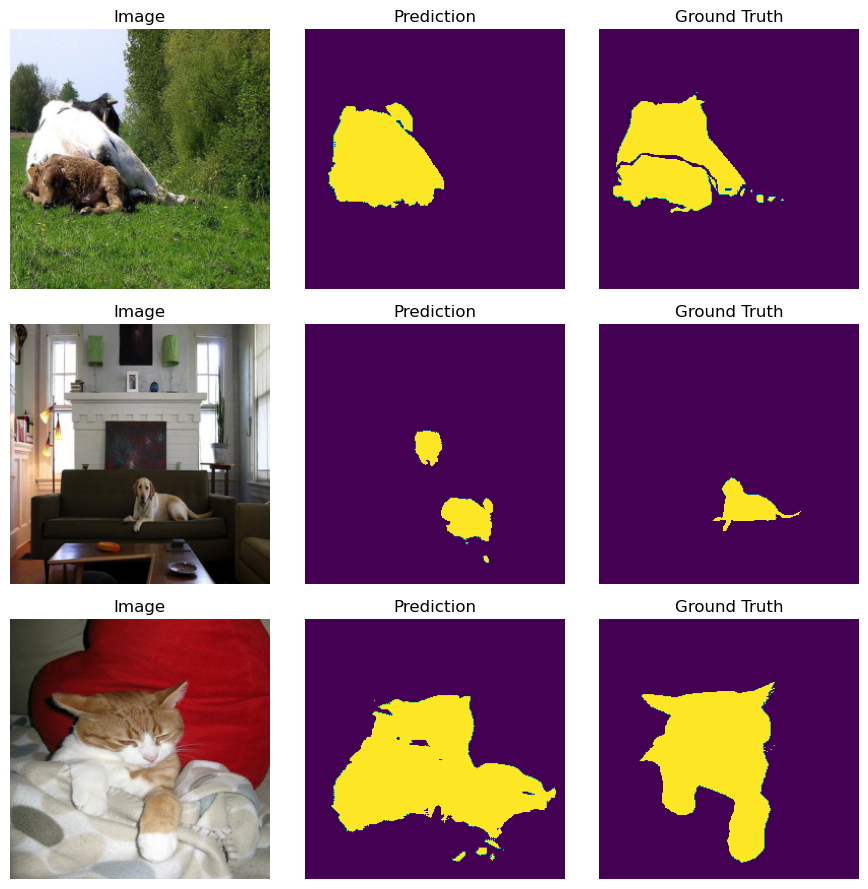

Model saved (epoch 17, mIoU 0.671)
Epoch  17: Train Loss: 0.3136, Val Loss: 0.2071, Val mIoU: 0.671
Visualizing first validation batch:


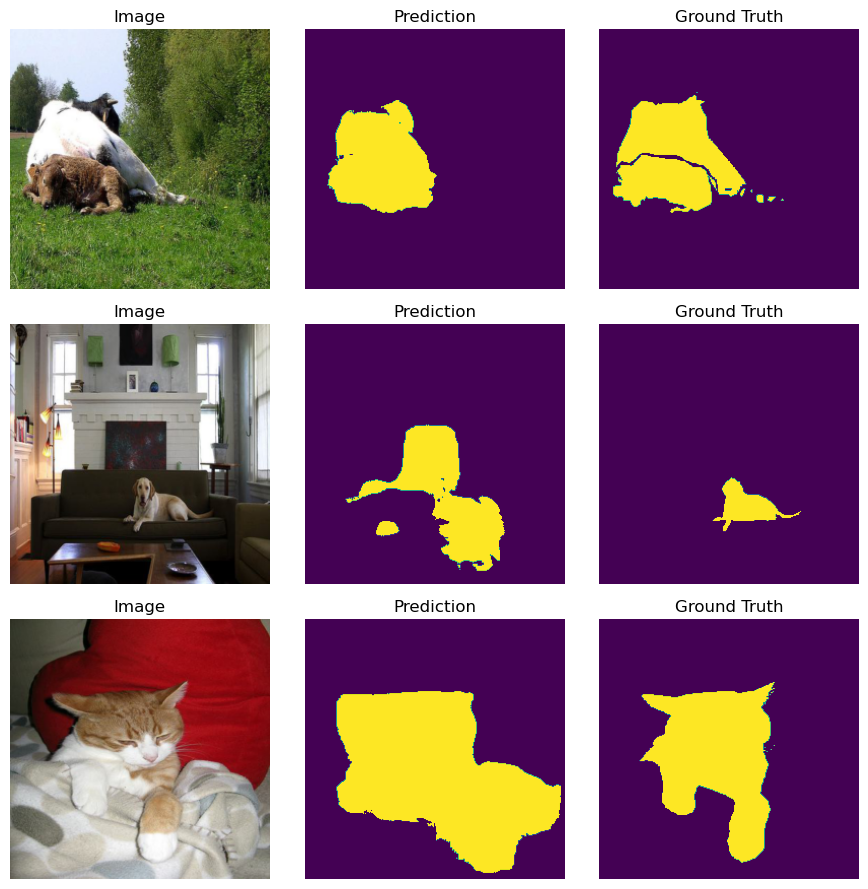

Epoch  18: Train Loss: 0.3039, Val Loss: 0.1782, Val mIoU: 0.663
Visualizing first validation batch:


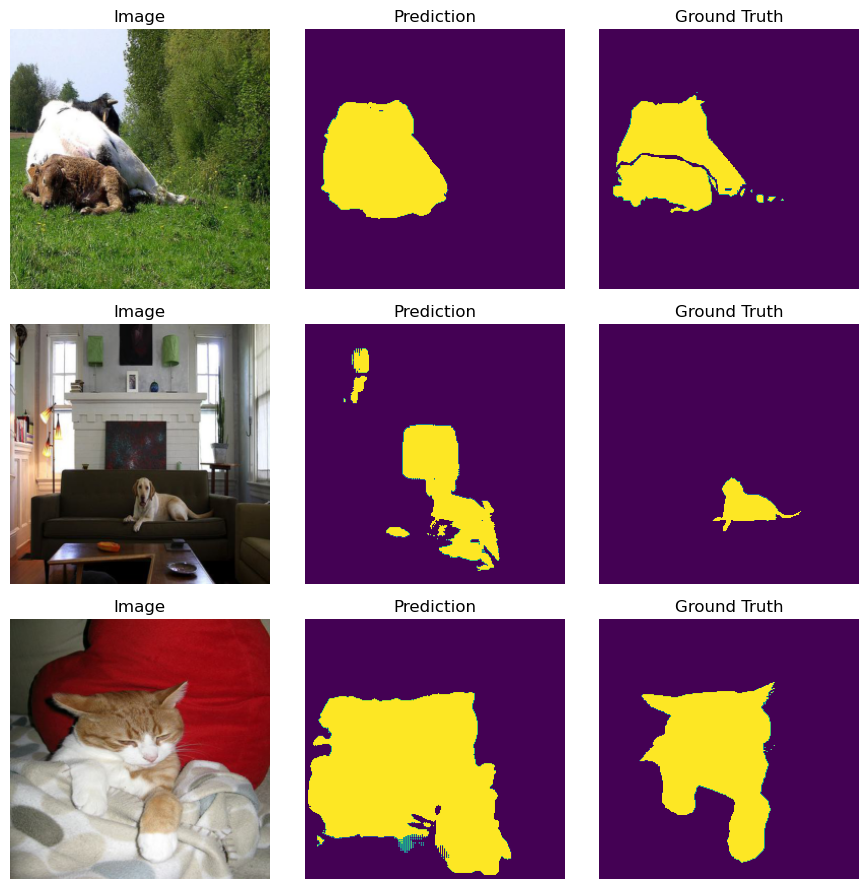

Epoch  19: Train Loss: 0.2941, Val Loss: 0.2838, Val mIoU: 0.634
Visualizing first validation batch:


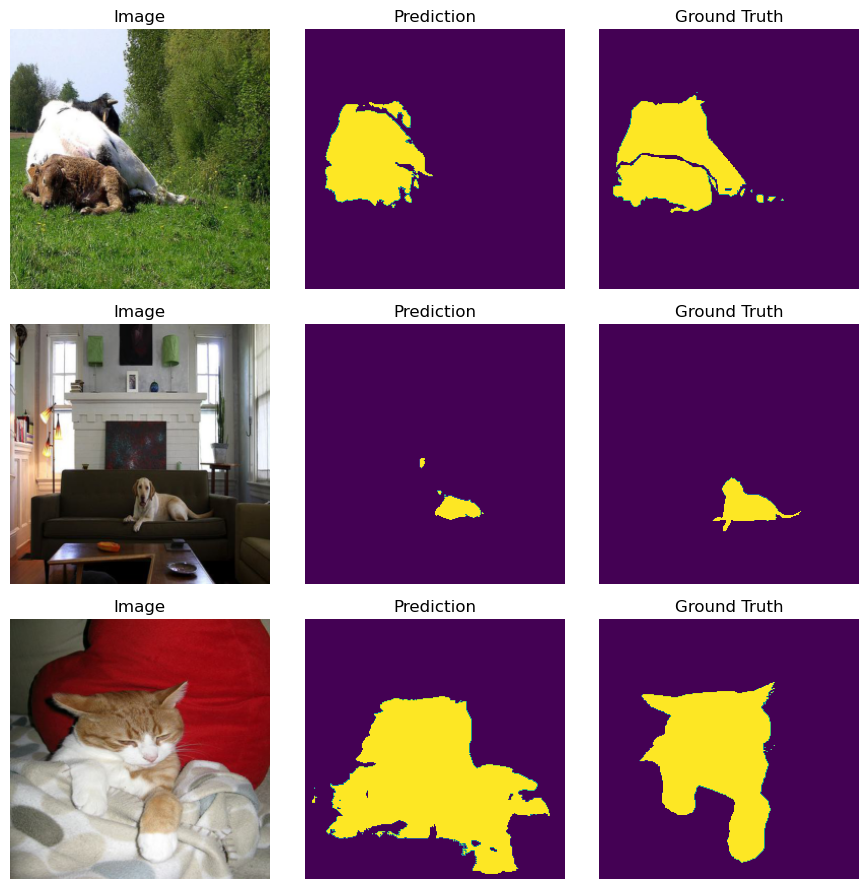

Epoch  20: Train Loss: 0.2924, Val Loss: 0.3201, Val mIoU: 0.614
Visualizing first validation batch:


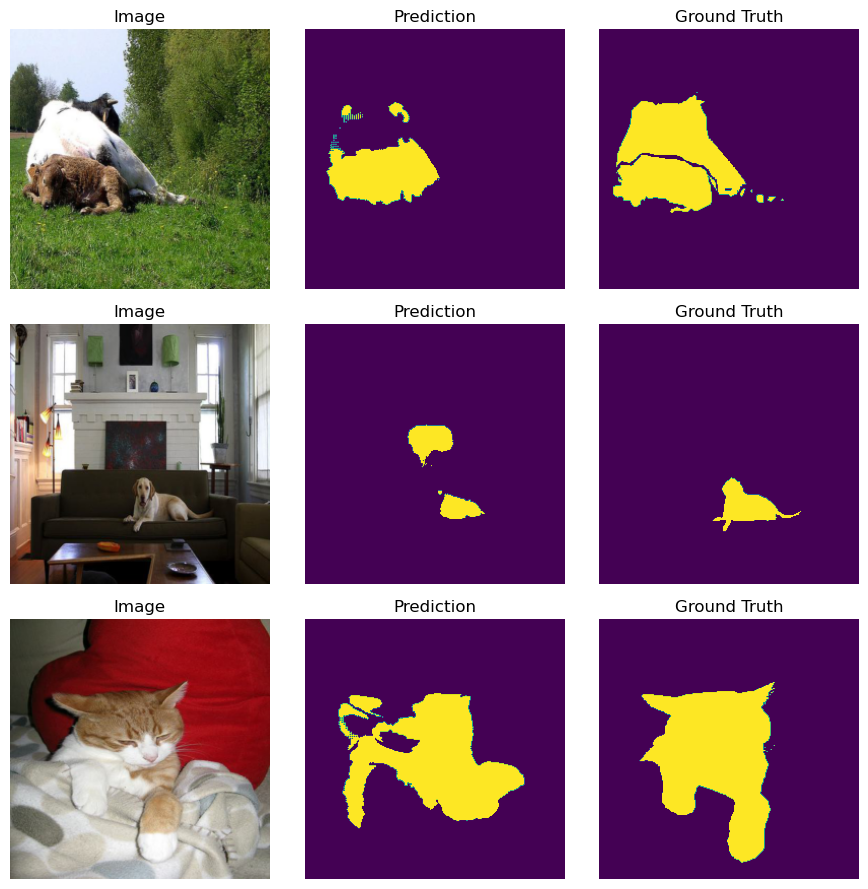

Epoch  21: Train Loss: 0.2719, Val Loss: 0.3283, Val mIoU: 0.625
Visualizing first validation batch:


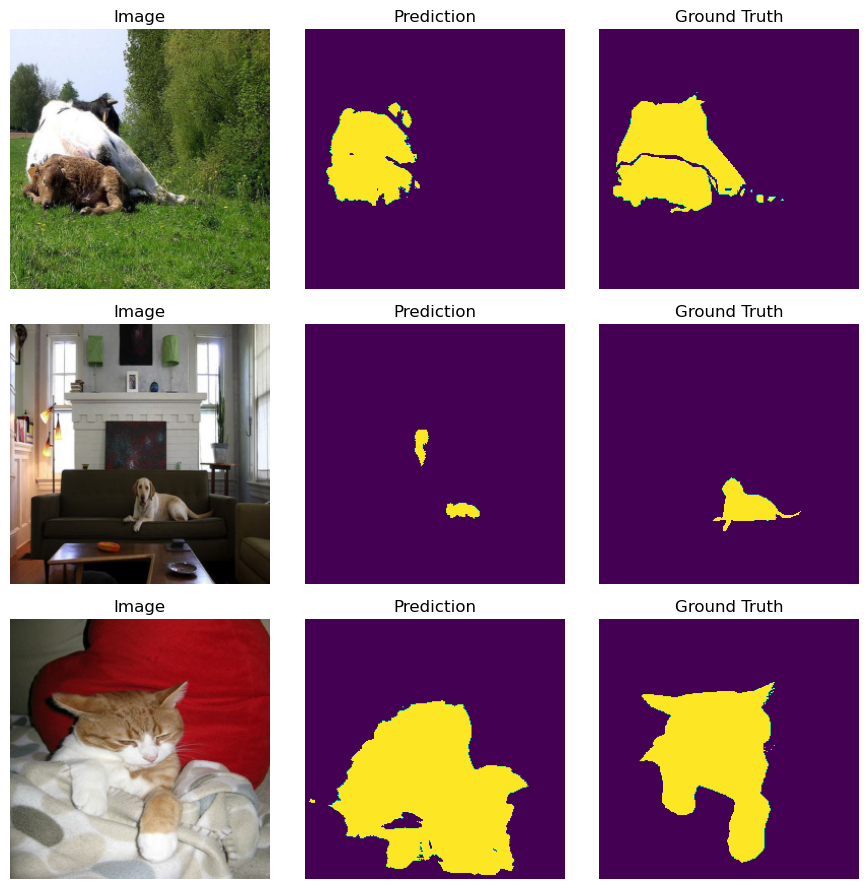

Epoch  22: Train Loss: 0.2585, Val Loss: 0.2343, Val mIoU: 0.662
Visualizing first validation batch:


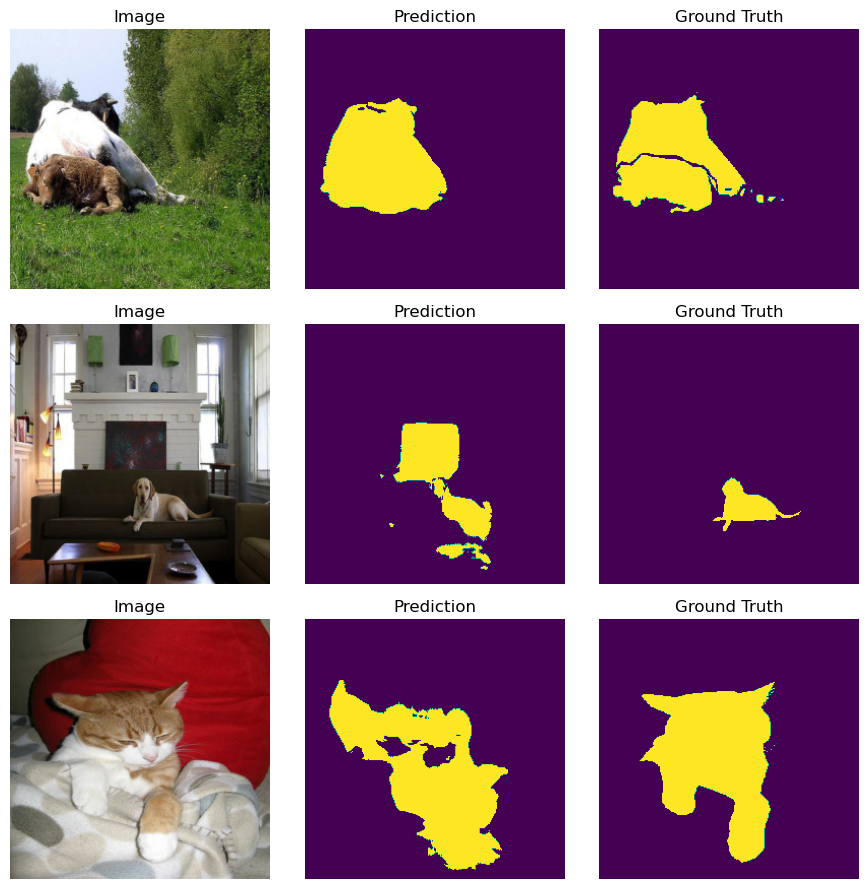

Epoch  23: Train Loss: 0.2448, Val Loss: 0.2457, Val mIoU: 0.668
Visualizing first validation batch:


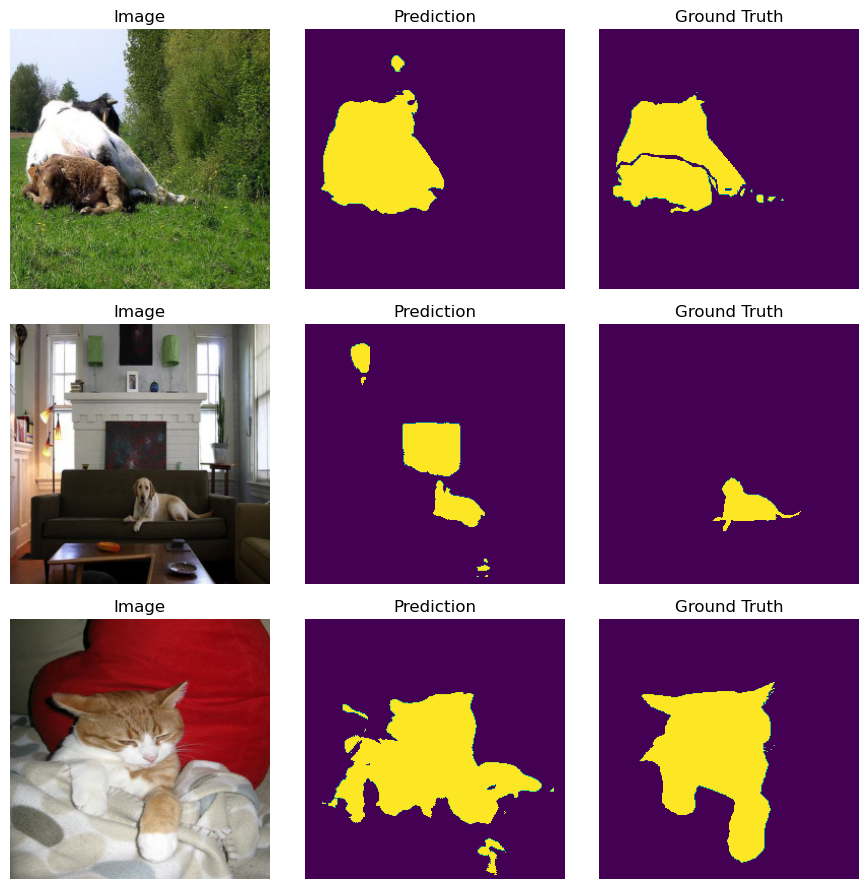

Epoch  24: Train Loss: 0.2367, Val Loss: 0.3057, Val mIoU: 0.635
Visualizing first validation batch:


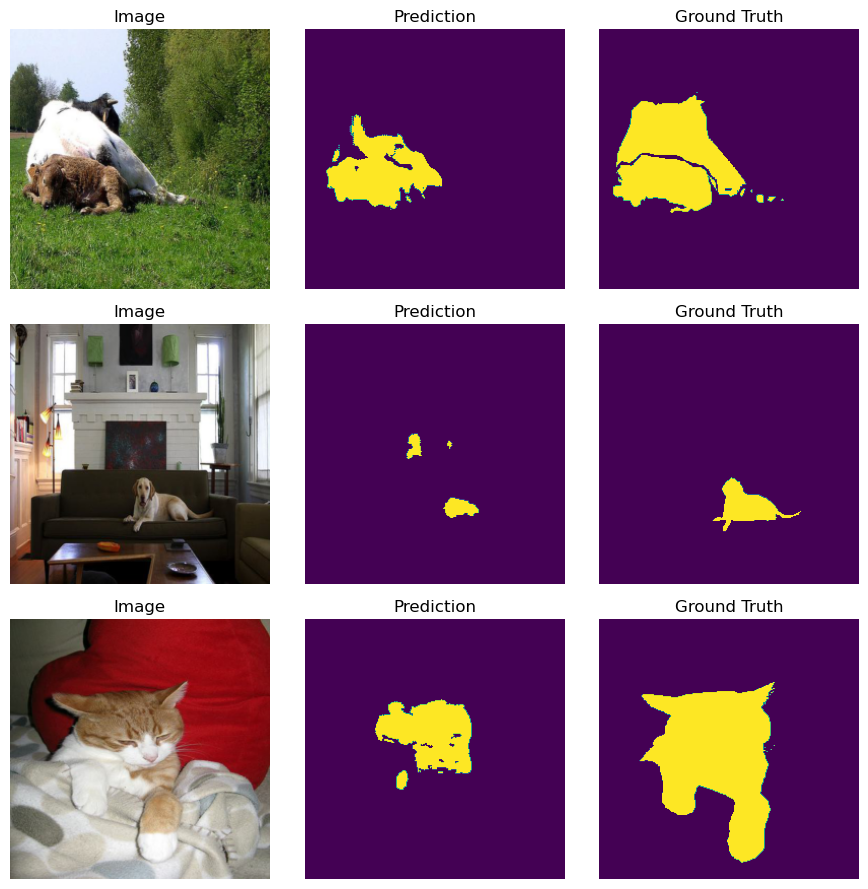

Model saved (epoch 25, mIoU 0.675)
Epoch  25: Train Loss: 0.2130, Val Loss: 0.2664, Val mIoU: 0.675
Visualizing first validation batch:


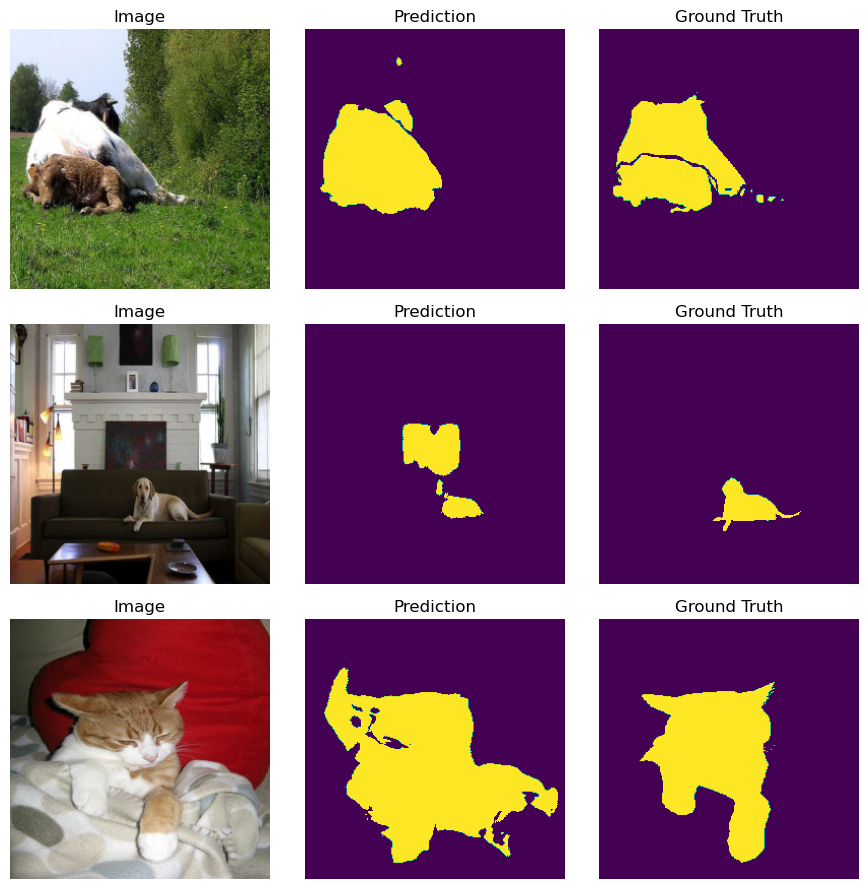

Epoch  26: Train Loss: 0.2017, Val Loss: 0.2137, Val mIoU: 0.663
Visualizing first validation batch:


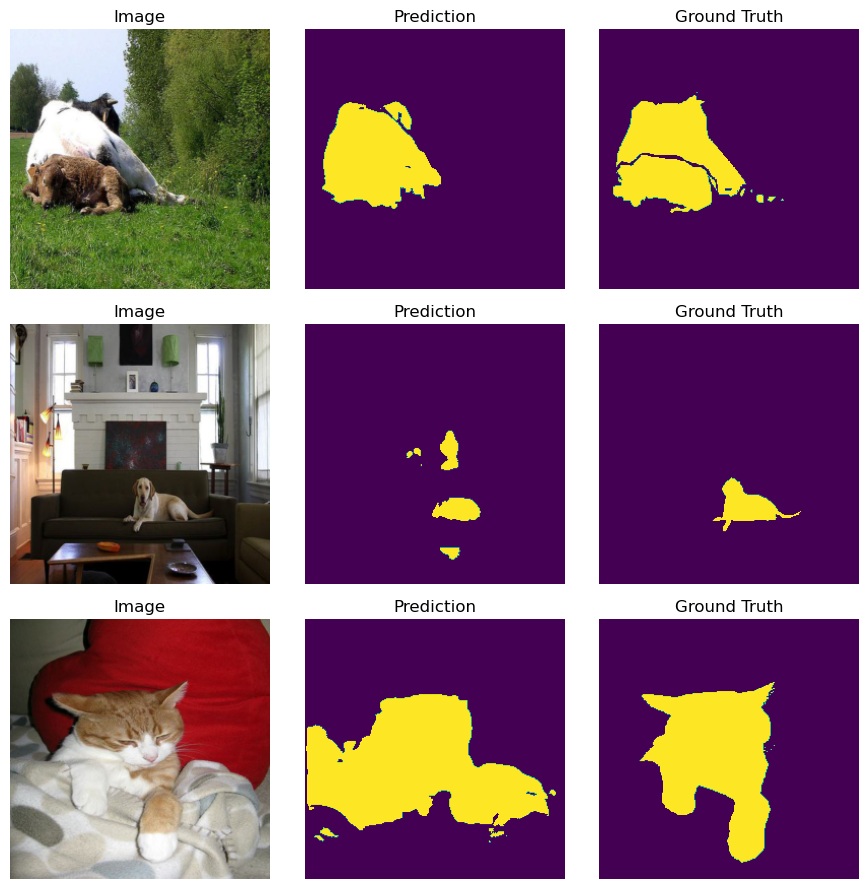

Epoch  27: Train Loss: 0.1988, Val Loss: 0.2593, Val mIoU: 0.663
Visualizing first validation batch:


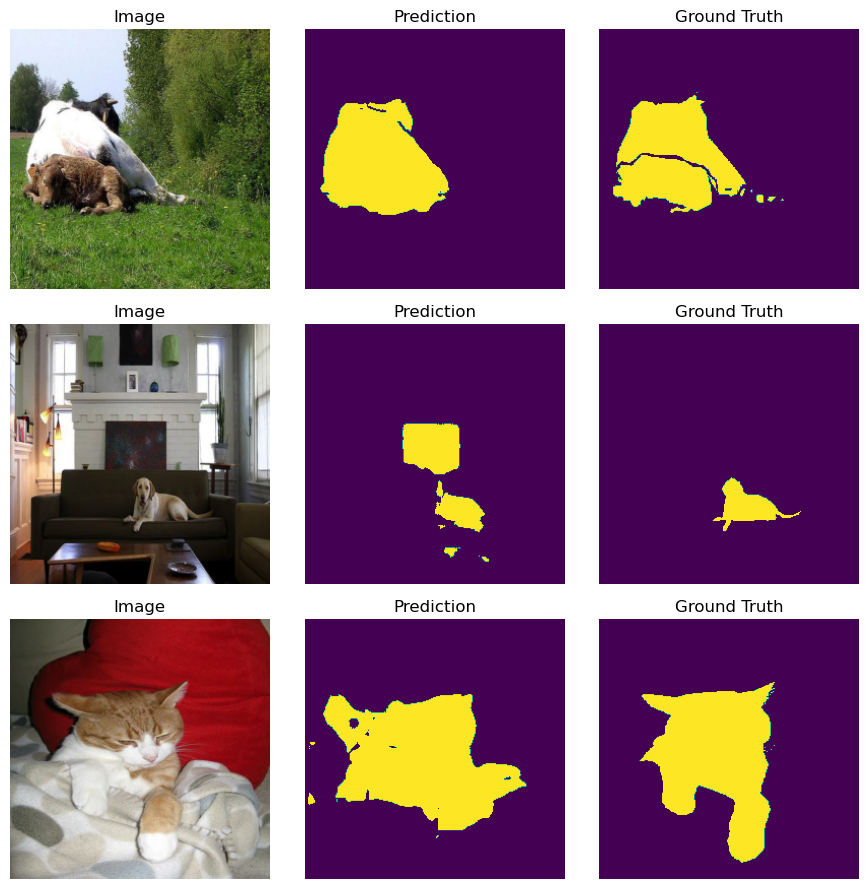

Epoch  28: Train Loss: 0.2072, Val Loss: 0.4134, Val mIoU: 0.601
Visualizing first validation batch:


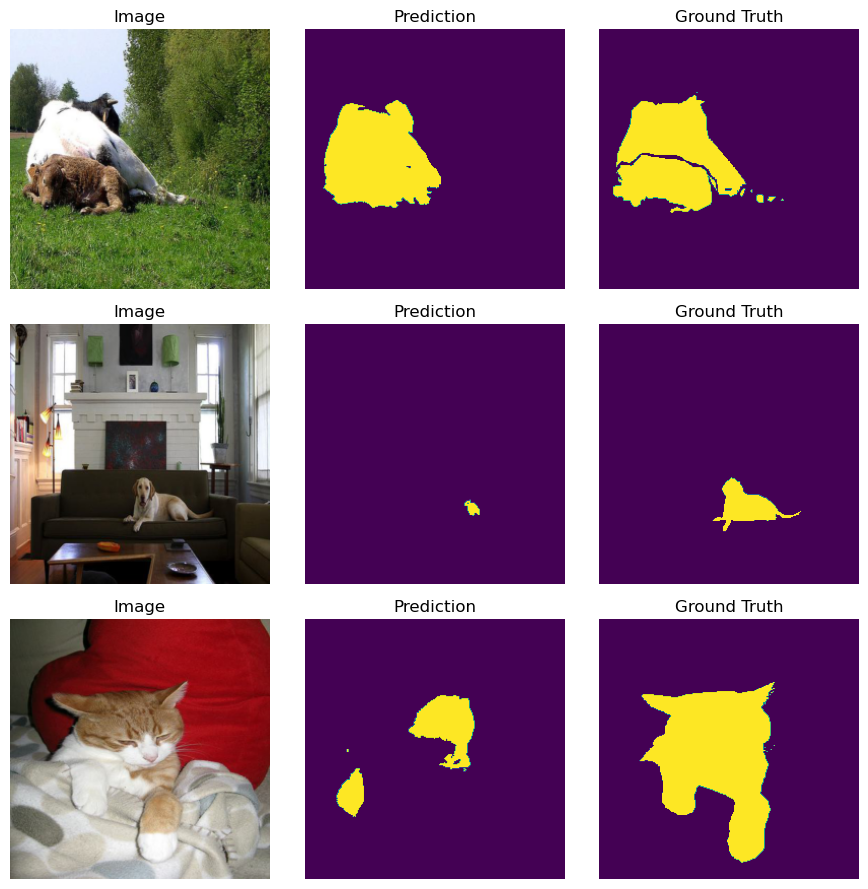

Model saved (epoch 29, mIoU 0.685)
Epoch  29: Train Loss: 0.1929, Val Loss: 0.2137, Val mIoU: 0.685
Visualizing first validation batch:


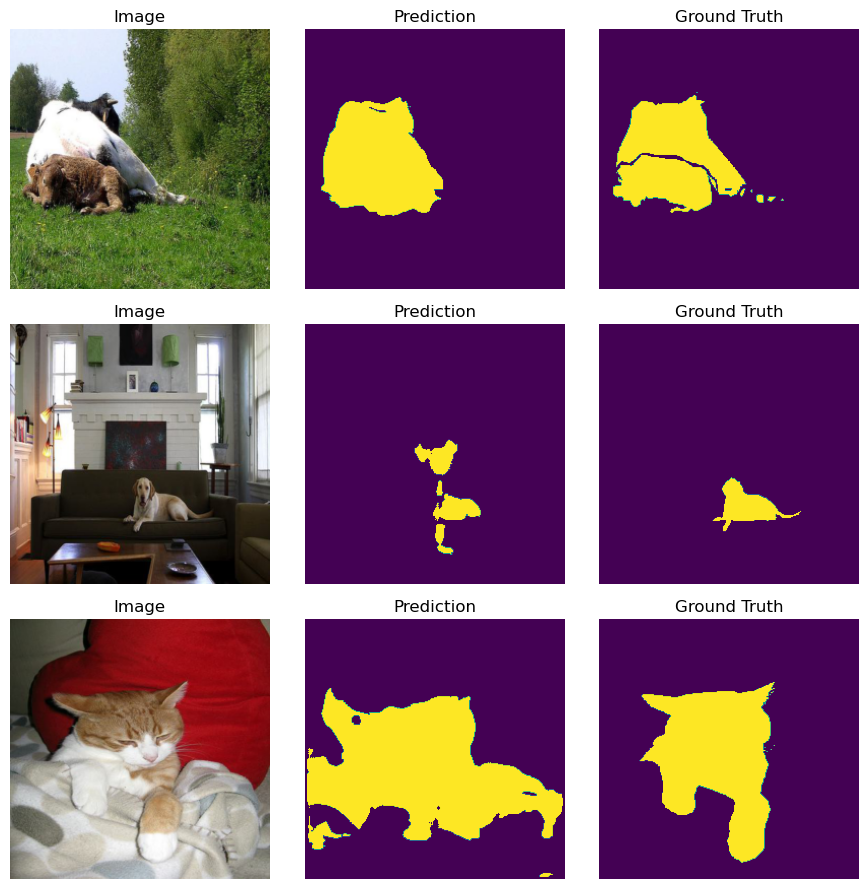

Epoch  30: Train Loss: 0.1779, Val Loss: 0.2543, Val mIoU: 0.678
Visualizing first validation batch:


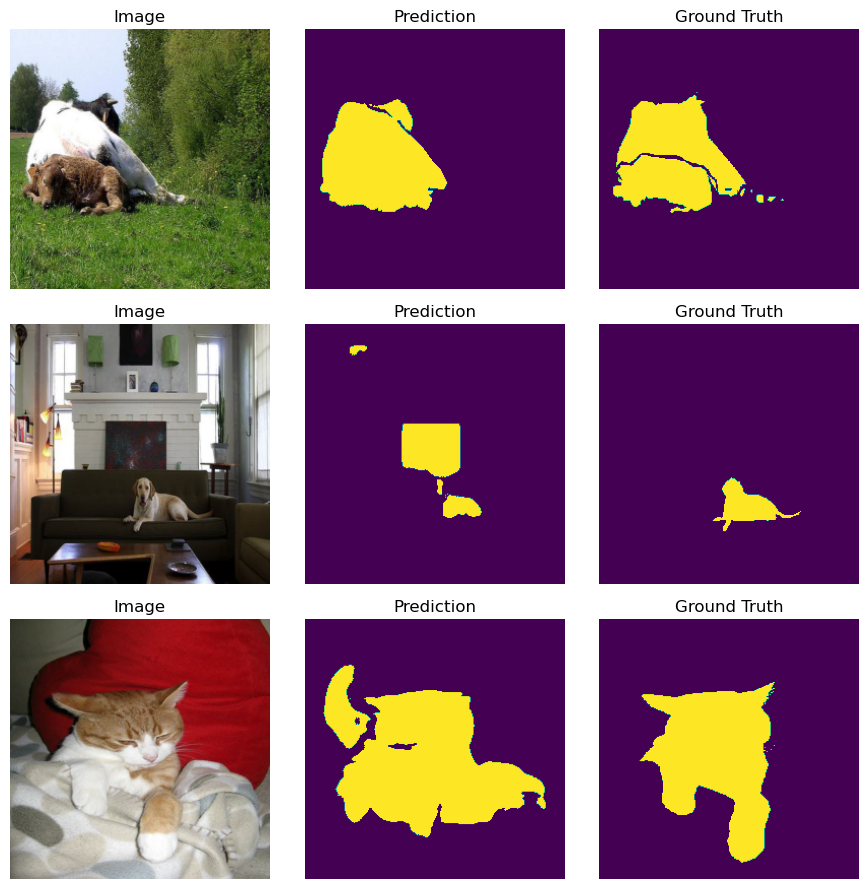

In [25]:
from tqdm import tqdm
import os
# ... UNet model and dhmetriv_loss, DataLoader, etc, as above ...
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np

# ========== Place your UNet model and dhmetriv_loss definition here =============
# from previous cell: class UNet(...):, def dhmetriv_loss(...):

# ========== Training and Validation setup ==========
os.makedirs('checkpoints', exist_ok=True)

best_val_miou = 0.0
BATCH_SIZE = 16
LEARNING_RATE = 1e-4
EPOCHS= 30
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
N_CLASSES = 3  # For Pascal VOC, adjust as needed

model = UNet(n_classes=N_CLASSES).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
# train_dataset, val_dataset must be defined earlier (previous messages)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

def miou(pred, mask, n_classes, ignore_index=255):
    # pred, mask: (N, H, W)
    # pred is already in [0, n_classes-1]
    ious = []
    pred = pred.cpu().numpy()
    mask = mask.cpu().numpy()
    for cls in range(n_classes):
        pred_inds = (pred == cls)
        target_inds = (mask == cls)
        if np.sum(target_inds) == 0:
            continue
        intersection = np.logical_and(pred_inds, target_inds).sum()
        union = np.logical_or(pred_inds, target_inds).sum()
        if union == 0: continue
        ious.append(intersection / (union + 1e-6))
    if len(ious) == 0:
        return 0
    return np.mean(ious)

def visualize_batch(img, pred, gt, class_colors=None):
    # img: (B, 3, H, W), pred/gt: (B, H, W)
    img = img.cpu().permute(0,2,3,1).numpy()  # B,H,W,3
    pred = pred.cpu().numpy()
    gt = gt.cpu().numpy()
    batch_size = img.shape[0]
    n = min(batch_size, 3)
    plt.figure(figsize=(9, n*3))
    for i in range(n):
        plt.subplot(n, 3, i*3+1)
        plt.imshow(img[i])
        plt.title("Image")
        plt.axis("off")

        plt.subplot(n, 3, i*3+2)
        plt.imshow(pred[i] if class_colors is None else class_colors[pred[i]])
        plt.title("Prediction")
        plt.axis("off")

        plt.subplot(n, 3, i*3+3)
        plt.imshow(gt[i] if class_colors is None else class_colors[gt[i]])
        plt.title("Ground Truth")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


for epoch in range(1, EPOCHS+1):
    model.train()
    train_loss = 0.
    train_pbar = tqdm(enumerate(train_loader), total=len(train_loader),
                      desc=f"Epoch {epoch} [Train]", leave=False, ncols=90)
    for batch_idx, (img, mask, _) in train_pbar:
        img, mask = img.to(DEVICE), mask.to(DEVICE)
        masked_labels = mask.clone().long()
        masked_labels[mask==255] = 0
        partial_mask = ((mask != 255)).float()
        outputs = model(img)
        loss = dhmetriv_loss(outputs, masked_labels, partial_mask, weight_consistency=0.1)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()*img.size(0)
        avg_train_loss = train_loss / ((batch_idx+1)*img.size(0))
        train_pbar.set_postfix(loss=avg_train_loss)
    train_loss /= len(train_loader.dataset)

    # Validation with progress bar
    model.eval()
    val_loss = 0.
    miou_sum = 0
    num_batches = 0
    val_imgs, val_preds, val_gts = None, None, None
    val_pbar = tqdm(enumerate(val_loader), total=len(val_loader),
                    desc=f"Epoch {epoch} [Val]", leave=False, ncols=90)
    with torch.no_grad():
        for batch_idx, (img, mask, _) in val_pbar:
            img, mask = img.to(DEVICE), mask.to(DEVICE)
            masked_labels = mask.clone().long()
            masked_labels[mask==255] = 0
            partial_mask = ((mask != 255)).float()
            outputs = model(img)
            loss = loss = dhmetriv_loss(outputs, masked_labels, partial_mask,weight_consistency=0.1,class_weights=weights)
            val_loss += loss.item()*img.size(0)
            pred = torch.argmax(outputs, dim=1)
            miou_batch = miou(pred, mask, n_classes=N_CLASSES)
            miou_sum += miou_batch
            num_batches += 1
            avg_val_loss = val_loss / ((batch_idx+1)*img.size(0))
            val_pbar.set_postfix(loss=avg_val_loss)
            if val_imgs is None:
                val_imgs = img.cpu()
                val_preds = pred.cpu()
                val_gts = mask.cpu()
    val_loss /= len(val_loader.dataset)
    val_miou = miou_sum / num_batches if num_batches > 0 else 0.0
    
    if val_miou > best_val_miou:
        best_val_miou = val_miou
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'val_miou': val_miou
        }
        torch.save(checkpoint, f'checkpoints/best_model_epoch{epoch}.pth')
        print(f"Model saved (epoch {epoch}, mIoU {val_miou:.3f})")


    print(f"Epoch {epoch:3d}: Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val mIoU: {val_miou:.3f}")



    # Visualization
    if val_imgs is not None:
        print("Visualizing first validation batch:")
        visualize_batch(val_imgs, val_preds, val_gts)